# Import Packages

In [ ]:
# Import necessary libraries
import os
import glob
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats
import statsmodels.stats.multicomp as mc

# Set Plot Parameters

In [ ]:
# Change Seaborn package violin plot to have black lines instead of gray

# Import the necessary module from seaborn
import seaborn.categorical

# Save the original ViolinPlotter class
seaborn.categorical._Old_Violin = seaborn.categorical._ViolinPlotter

# Define a new ViolinPlotter class that inherits from the original
class _My_ViolinPlotter(seaborn.categorical._Old_Violin):

    def __init__(self, *args, **kwargs):
        # Initialize the parent class
        super(_My_ViolinPlotter, self).__init__(*args, **kwargs)
        # Change the color of the lines to black
        self.gray='k'

# Replace the original ViolinPlotter with the new one
seaborn.categorical._ViolinPlotter = _My_ViolinPlotter

# Import seaborn package
import seaborn as sns

In [ ]:
# Set figure style
sns.set(style='ticks', palette='viridis', context='paper', font_scale=2)
mpl.rcParams['figure.dpi'] = 600
mpl.rcParams['axes.edgecolor'] = 'k'
mpl.rcParams['text.color'] = 'k'
mpl.rcParams['axes.labelcolor'] = 'k'
mpl.rcParams['xtick.color'] = 'k'
mpl.rcParams['ytick.color'] = 'k'
mpl.rcParams['font.weight'] = 'bold'
mpl.rcParams['axes.labelweight'] = 'bold'
mpl.rcParams['axes.titleweight'] = 'bold'
mpl.rcParams['errorbar.capsize'] = 2.5
mpl.rcParams['legend.frameon'] = False

# Define D y-axis limits for violin plots
D_plot_lim = [1.475, 3.1]

# Create a palette that keeps the color of the CSCs and non-CSCs consistent
stem_palette = {
    'NonCSC': sns.color_palette('viridis')[-2],
    'CSC': sns.color_palette('viridis')[1],
    'ALDH-': sns.color_palette('viridis')[-2],
    'ALDH+': sns.color_palette('viridis')[1],
    'ALDH-/CD133-': sns.color_palette('viridis')[-2],
    'ALDH+/CD133+': sns.color_palette('viridis')[1],
    'DOT1Li ALDH-': sns.color_palette('viridis')[0],
    'DOT1Li ALDH+': sns.color_palette('viridis')[3]
}

# Read in Data

In [ ]:
# Common path to OneDrive folder with data shared between computers
subgroup_folder = '\\OneDrive - Northwestern University\\Documents - Backman Lab - Shared Folders'

# Find full path to CSC folder in OneDrive for the current computer in use
parent_folder = glob.glob('C:\\Users\\**'+subgroup_folder)[0]+'\\Subgroup Folders\\Chromatin\\Cancer Stem Cells'

# Define directories for paper, saving figures, data, TSNE input files, and gene lists
paper_dir = parent_folder + '\\Paper'
save_dir = paper_dir + '\\All Figures'
data_dir = paper_dir + '\\Data'
tsne_dir = data_dir + '\\TSNE input files'
gene_dir = data_dir + '\\Gene Lists'

# Read in data from CSV files
allpwsdata = pd.read_csv(data_dir+'\\OCSC_PWS_Data_2016_to_2021.csv')
baselineTPM = pd.read_csv(data_dir+'\\Baseline_RNAseq_TPM.csv',index_col=0,dtype='str')
comboTPM = pd.read_csv(data_dir+'\\Combination_Treatment_RNAseq_TPM.csv',index_col=0,dtype='str')
DNARepairIDs = pd.read_csv(data_dir+'\\ensembleid2geneid_DNARepair.csv',index_col=0,dtype='str')

# Initialize an empty DataFrame for TSNE data
tsne_all = pd.DataFrame()
# Define conditions for TSNE data
tsne_conds = ['pbs_dn','pbs_dp','carb_dn','carb_dp']
# Loop through each condition and read in the TSNE data
for cond in tsne_conds:
    tsne_temp = pd.DataFrame()
    for i in range(3):
        tsne_temp[i] = pd.read_csv(tsne_dir+'\\weighted_'+cond+'_tsne_'+str(i+1)+'.csv',index_col=0)
    tsne_all = pd.concat([tsne_all, tsne_temp])

# Initialize an empty DataFrame for poised genes
poised_genes = pd.DataFrame(columns=['Condition','Gene'])
# Loop through each file in the gene directory and read in the gene lists
for file in os.listdir(gene_dir):
    gene_list = pd.read_csv(gene_dir+'\\'+file)
    # Determine the condition based on the file content
    if not 'exclusively' in gene_list.columns[0]:
        gene_list['Condition'] = 'Both'
    elif 'plus' in gene_list.columns[0]:
        gene_list['Condition'] = 'ALDH+'
    else:
        gene_list['Condition'] = 'ALDH-'
    gene_list.columns = ['Gene','Condition']
    poised_genes = pd.concat([poised_genes, gene_list], ignore_index=True)

# Define a function to return significance stars based on p-value
def sigfunc(pcorr):
    if pcorr < 0.001:
        sigval = '***'
    elif pcorr < 0.01:
        sigval = '**'
    elif pcorr < 0.05:
        sigval = '*'
    else:
        sigval = ''
    return(sigval)

# Create PWS Violin Plots

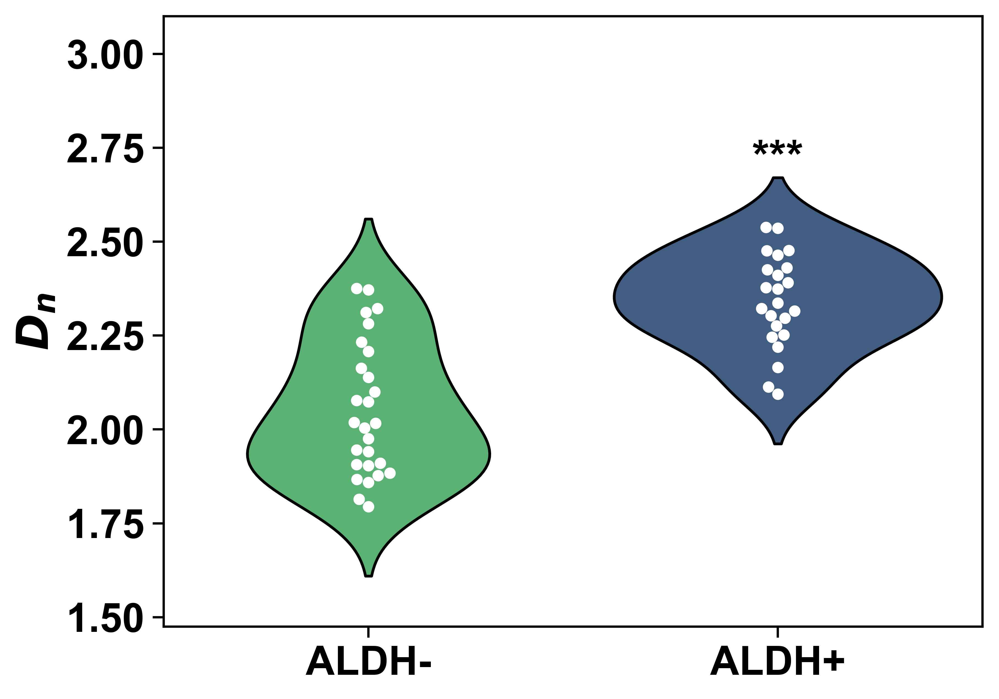

Test Multiple Comparison ttest_ind 
FWER=0.05 method=bonf
alphacSidak=0.05, alphacBonf=0.050
group1 group2  stat  pval pval_corr reject
------------------------------------------
 ALDH+  ALDH- 6.5503  0.0       0.0   True
------------------------------------------

Label
ALDH-    2.050756
ALDH+    2.340775
Name: (D, mean), dtype: float64

Label
ALDH-    27
ALDH+    23
Name: count, dtype: int64

Corrected P-value: 3.600991200310769e-08


In [ ]:
# Define the date filter for the data
datefilter = ['2016-12-16','2017-01-20']#,'2017-02-22']

# Filter the data for the specified cell line and dates
ovcarstempws = allpwsdata[(allpwsdata['Cell Line']=='OVCAR5')&(allpwsdata['Date'].isin(datefilter))].copy()

# Define the order of the labels for plotting
fig_order = ['ALDH-','ALDH+']
ovcarstempws['Label'] = pd.Categorical(ovcarstempws['Label'],fig_order)
ovcarstempws.sort_values('Label',inplace=True)

# Create the violin plot
fig, ax = plt.subplots()
sns.violinplot(data=ovcarstempws,x='Label',y='D',palette=stem_palette,inner=None,ax=ax)
sns.swarmplot(data=ovcarstempws,x='Label',y='D',color='w',ax=ax)
ax.set_ylim(D_plot_lim)
ax.set_xlabel('')
ax.set_ylabel(r'$D_n$')

# Perform statistical comparison between groups
csc_comp = mc.MultiComparison(ovcarstempws['D'], ovcarstempws['Label'])
tbl, a1, a2 = csc_comp.allpairtest(stats.ttest_ind, method= 'bonf')

# Add significance stars to the plot
ax.text(1,max(ovcarstempws.loc[ovcarstempws['Label']=='ALDH+','D'])+0.125,sigfunc(a1[2]),color='k',ha='center',
        va='bottom')

# Show and save the plot
plt.show()
fig.savefig(save_dir+'\\OVCAR5 ALDH+ vs ALDH- PWS.tif',dpi=600,transparent=True,bbox_inches='tight')

# Print the statistical comparison table
print(tbl)

# Calculate and print the mean of 'D' for each label
nucmean = ovcarstempws.groupby('Label').describe()['D','mean']
print('\n'+str(nucmean))

# Print the count of each label
numnuc = ovcarstempws['Label'].value_counts()
print('\n'+str(numnuc))

# Print the corrected p-value
print('\nCorrected P-value: '+str(a1[2].item()))

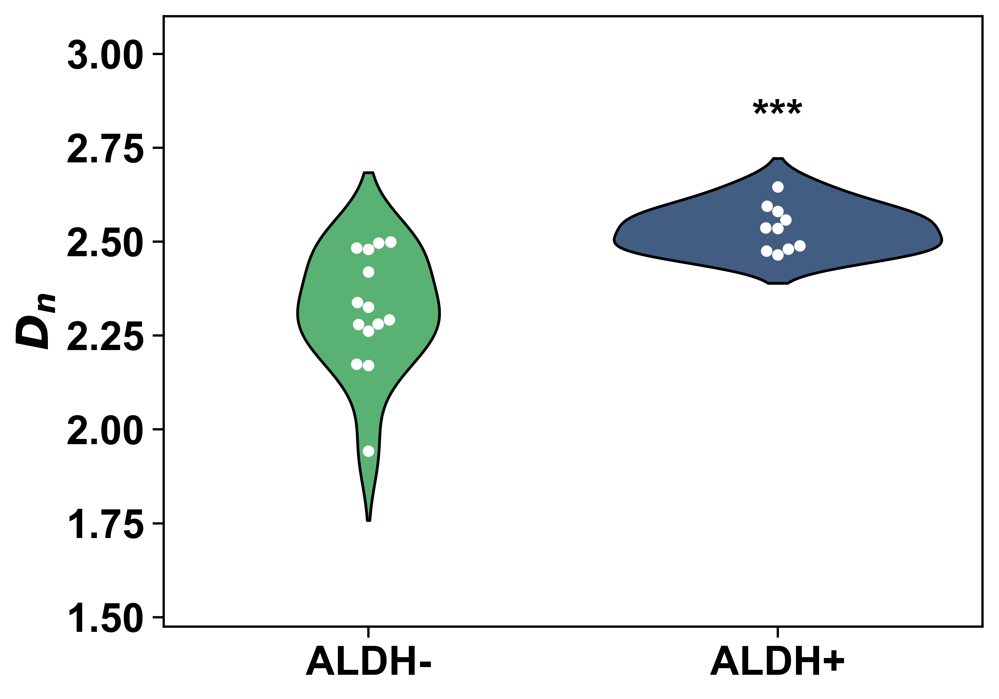

Test Multiple Comparison ttest_ind 
FWER=0.05 method=bonf
alphacSidak=0.05, alphacBonf=0.050
group1 group2  stat   pval  pval_corr reject
--------------------------------------------
 ALDH+  ALDH- 4.1781 0.0004    0.0004   True
--------------------------------------------

Label
ALDH-    2.317345
ALDH+    2.535984
Name: (D, mean), dtype: float64

Label
ALDH-    14
ALDH+    10
Name: count, dtype: int64

Corrected P-value: 0.0003905244476783511


In [ ]:
# Filter the data for the specified cell line
ovcar3stempws = allpwsdata[(allpwsdata['Cell Line']=='OVCAR3')].copy()

# Define the order of the labels for plotting
fig_order = ['ALDH-','ALDH+']
ovcar3stempws['Label'] = pd.Categorical(ovcar3stempws['Label'],fig_order)
ovcar3stempws.sort_values('Label',inplace=True)

# Create the violin plot
fig, ax = plt.subplots()
sns.violinplot(data=ovcar3stempws,x='Label',y='D',palette=stem_palette,inner=None,ax=ax)
sns.swarmplot(data=ovcar3stempws,x='Label',y='D',color='w',ax=ax)
ax.set_ylim(D_plot_lim)
ax.set_xlabel('')
ax.set_ylabel(r'$D_n$')

# Perform statistical comparison between groups
csc_comp = mc.MultiComparison(ovcar3stempws['D'], ovcar3stempws['Label'])
tbl, a1, a2 = csc_comp.allpairtest(stats.ttest_ind, method= 'bonf')

# Add significance stars to the plot
ax.text(1,max(ovcar3stempws.loc[ovcar3stempws['Label']=='ALDH+','D'])+0.125,sigfunc(a1[2]),color='k',ha='center',
        va='bottom')

# Show and save the plot
plt.show()
fig.savefig(save_dir+'\\OVCAR3 ALDH+ vs ALDH- PWS.tif',dpi=600,transparent=True,bbox_inches='tight')

# Print the statistical comparison table
print(tbl)

# Calculate and print the mean of 'D' for each label
nucmean = ovcar3stempws.groupby('Label').describe()['D','mean']
print('\n'+str(nucmean))

# Print the count of each label
numnuc = ovcar3stempws['Label'].value_counts()
print('\n'+str(numnuc))

# Print the corrected p-value
print('\nCorrected P-value: '+str(a1[2].item()))

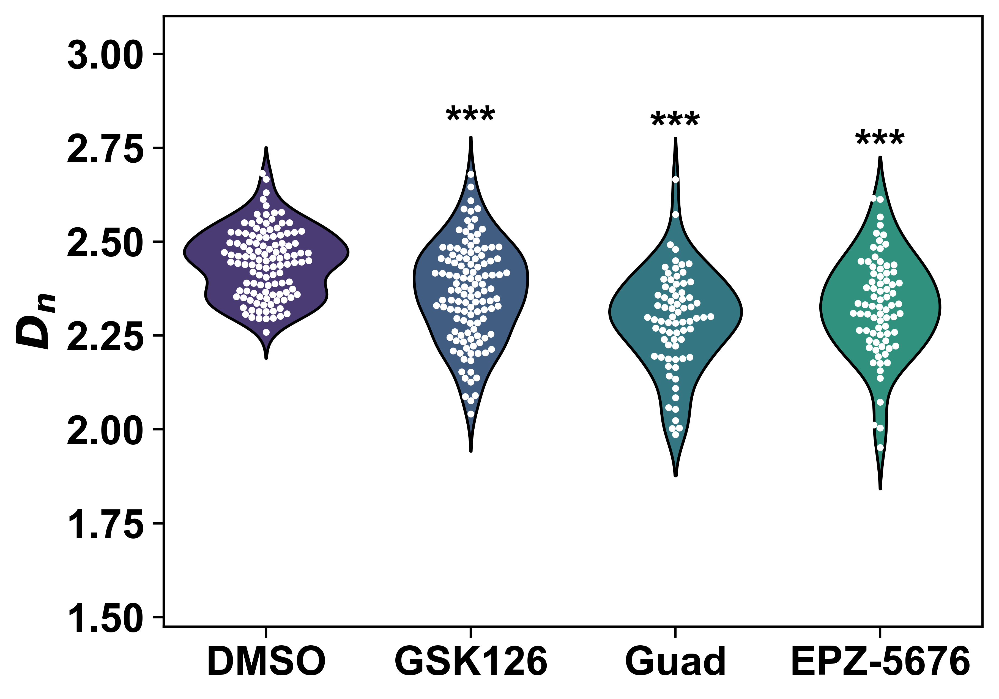

Test Multiple Comparison ttest_ind 
FWER=0.05 method=bonf
alphacSidak=0.01, alphacBonf=0.008
 group1   group2    stat   pval  pval_corr reject
-------------------------------------------------
    DMSO EPZ-5676  7.3531    0.0       0.0   True
    DMSO   GSK126  5.5469    0.0       0.0   True
    DMSO     Guad   9.688    0.0       0.0   True
EPZ-5676   GSK126 -1.8856 0.0608    0.3649  False
EPZ-5676     Guad  1.7795 0.0772    0.4631  False
  GSK126     Guad  3.8288 0.0002     0.001   True
-------------------------------------------------

Treatment
DMSO        2.443967
GSK126      2.363726
Guad        2.290343
EPZ-5676    2.328030
Name: (D, mean), dtype: float64

Treatment
GSK126      120
DMSO        118
EPZ-5676     78
Guad         74
Name: count, dtype: int64

  Treatment  Corrected P Value
0    GSK126       4.667429e-07
1      Guad       1.633757e-17
2  EPZ-5676       3.179043e-11


In [ ]:
# Define the date filter for the data
datefilter = ['2018-01-30']

# Filter the data for the specified cell line, date, and treatment
epiovcarpws = allpwsdata[(allpwsdata['Cell Line']=='OVCAR5')&(allpwsdata['Date'].isin(datefilter))&
                        (allpwsdata['Treatment']!='Entinostat')].copy()

# Replace treatment names for better readability
epiovcarpws['Treatment'] = epiovcarpws.Treatment.str.replace('SGI-110','Guad')

# Define the order of the treatments for plotting
fig_order = ['DMSO','GSK126','Guad','EPZ-5676']
epiovcarpws['Treatment'] = pd.Categorical(epiovcarpws['Treatment'],fig_order)
epiovcarpws.sort_values('Treatment',inplace=True)

# Create the violin plot
fig, ax = plt.subplots()
sns.violinplot(data=epiovcarpws,x='Treatment',y='D',inner=None,ax=ax)
sns.swarmplot(data=epiovcarpws,x='Treatment',y='D',color='w',size=3,ax=ax)

# Set plot limits and labels
ax.set_ylim(D_plot_lim)
ax.set_xlabel('')
ax.set_ylabel(r'$D_n$')

# Perform statistical comparison between groups
csc_comp = mc.MultiComparison(epiovcarpws['D'], epiovcarpws['Treatment'])
tbl, a1, a2 = csc_comp.allpairtest(stats.ttest_ind, method= 'bonf')
csc_stats = pd.read_html(tbl.as_html(),header=0)[0]

# Filter and sort the statistical comparison results for DMSO
csc_dmso_stats = csc_stats[(csc_stats['group1']=='DMSO')|(csc_stats['group2']=='DMSO')].copy()
csc_dmso_stats.loc[csc_stats['group1']!='DMSO',['group1','group2']] = csc_dmso_stats.loc[csc_stats['group1']!='DMSO',
                                                                                         ['group2','group1']].values
csc_dmso_stats['group2'] = pd.Categorical(csc_dmso_stats['group2'],categories=fig_order[1:])
csc_dmso_stats.sort_values('group2',inplace=True)

# Initialize a DataFrame to store corrected p-values
csc_dmso_pval = pd.DataFrame(columns=['Treatment','Corrected P Value'])

# Add significance stars to the plot
for vnum, violin in enumerate(epiovcarpws['Treatment'].unique()):
    if violin!='DMSO':
        cscpval = a1[2][csc_dmso_stats.index[csc_dmso_stats['group2']==violin].values].item()
        csc_dmso_pval.loc[len(csc_dmso_pval.index)] = [violin,cscpval]  
        ax.text(violin,max(epiovcarpws.loc[epiovcarpws['Treatment']==violin,'D'])+0.075,sigfunc(cscpval),color='k',
                ha='center',va='bottom')

# Show and save the plot
plt.show()
fig.savefig(save_dir+'\\OVCAR5 Epigenetic Inhibitors PWS No Entinostat.tif',dpi=600,transparent=True,
            bbox_inches='tight')

# Print the statistical comparison table
print(tbl)

# Calculate and print the mean of 'D' for each treatment
nucmean = epiovcarpws.groupby('Treatment').describe()['D','mean']
print('\n'+str(nucmean))

# Print the count of each treatment
numnuc = epiovcarpws['Treatment'].value_counts()
print('\n'+str(numnuc)+'\n')

# Print the corrected p-values
print(csc_dmso_pval)

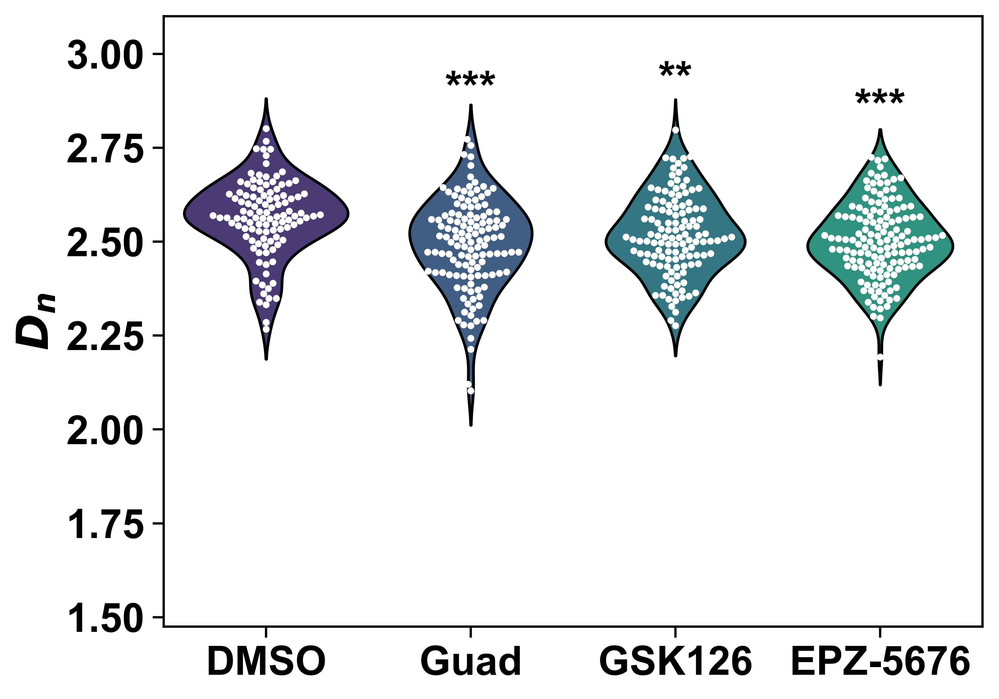

Test Multiple Comparison ttest_ind 
FWER=0.05 method=bonf
alphacSidak=0.01, alphacBonf=0.008
 group1   group2    stat   pval  pval_corr reject
-------------------------------------------------
    DMSO EPZ-5676  4.7808    0.0       0.0   True
    DMSO   GSK126  3.3359  0.001    0.0059   True
    DMSO     Guad  4.7568    0.0       0.0   True
EPZ-5676   GSK126 -1.2534 0.2111       1.0  False
EPZ-5676     Guad  0.6466 0.5184       1.0  False
  GSK126     Guad  1.7045 0.0895    0.5372  False
-------------------------------------------------

Treatment
DMSO        2.563395
Guad        2.493606
GSK126      2.518023
EPZ-5676    2.502287
Name: (D, mean), dtype: float64

Treatment
EPZ-5676    144
Guad        128
GSK126      124
DMSO        110
Name: count, dtype: int64

  Treatment  Corrected P Value
0      Guad           0.000021
1    GSK126           0.005939
2  EPZ-5676           0.000018


In [ ]:
# Define the date filter for the data
datefilter = ['2018-03-28']

# Filter the data for the specified cell line, date, label, and treatment
epicovpws = allpwsdata[(allpwsdata['Cell Line']=='COV362')&(allpwsdata['Date'].isin(datefilter))&
                        (allpwsdata['Label']=='ALDH+CD133+')&(allpwsdata['Treatment']!='Entinostat')&
                       (allpwsdata['Treatment']!='Untreated')].copy()

# Replace treatment names for better readability
epicovpws['Treatment'] = epicovpws.Treatment.str.replace('SGI-110','Guad')
epicovpws['Treatment'] = epicovpws.Treatment.str.replace('EPZ5672','EPZ-5676')

# Define the order of the treatments for plotting
fig_order = ['DMSO','Guad','GSK126','EPZ-5676']
epicovpws['Treatment'] = pd.Categorical(epicovpws['Treatment'],fig_order)
epicovpws.sort_values('Treatment',inplace=True)

# Create the violin plot
fig, ax = plt.subplots()
sns.violinplot(data=epicovpws,x='Treatment',y='D',inner=None,ax=ax)
sns.swarmplot(data=epicovpws,x='Treatment',y='D',color='w',size=3,ax=ax)

# Set plot limits and labels
ax.set_ylim(D_plot_lim)
ax.set_xlabel('')
ax.set_ylabel(r'$D_n$')

# Perform statistical comparison between groups
csc_comp = mc.MultiComparison(epicovpws['D'], epicovpws['Treatment'])
tbl, a1, a2 = csc_comp.allpairtest(stats.ttest_ind, method= 'bonf')
csc_stats = pd.read_html(tbl.as_html(),header=0)[0]

# Filter and sort the statistical comparison results for DMSO
csc_dmso_stats = csc_stats[(csc_stats['group1']=='DMSO')|(csc_stats['group2']=='DMSO')].copy()
csc_dmso_stats.loc[csc_stats['group1']!='DMSO',['group1','group2']] = csc_dmso_stats.loc[csc_stats['group1']!='DMSO',
                                                                                         ['group2','group1']].values
csc_dmso_stats['group2'] = pd.Categorical(csc_dmso_stats['group2'],categories=fig_order[1:])
csc_dmso_stats.sort_values('group2',inplace=True)

# Initialize a DataFrame to store corrected p-values
csc_dmso_pval = pd.DataFrame(columns=['Treatment','Corrected P Value'])

# Add significance stars to the plot
for vnum, violin in enumerate(epicovpws['Treatment'].unique()):
    if violin!='DMSO':
        cscpval = a1[2][csc_dmso_stats.index[csc_dmso_stats['group2']==violin].values].item()
        csc_dmso_pval.loc[len(csc_dmso_pval.index)] = [violin,cscpval]  
        ax.text(violin,max(epicovpws.loc[epicovpws['Treatment']==violin,'D'])+0.075,sigfunc(cscpval),color='k',
                ha='center',va='bottom')

# Show and save the plot
plt.show()
fig.savefig(save_dir+'\\COV362 Epigenetic Inhibitors PWS No Entinostat.tif',dpi=600,transparent=True,
            bbox_inches='tight')

# Print the statistical comparison table
print(tbl)

# Calculate and print the mean of 'D' for each treatment
nucmean = epicovpws.groupby('Treatment').describe()['D','mean']
print('\n'+str(nucmean))

# Print the count of each treatment
numnuc = epicovpws['Treatment'].value_counts()
print('\n'+str(numnuc)+'\n')

# Print the corrected p-values
print(csc_dmso_pval)

# Create RNA-seq Plots

In [ ]:
# Filter out control columns from comboTPM
raw_TPM = comboTPM.loc[:, ~comboTPM.columns.str.contains('Control')]

# Remove rows with missing gene_id
raw_TPM = raw_TPM[~raw_TPM.gene_id.isna()].copy()

# Set the index to gene_id and SYMBOL
raw_TPM.set_index(['gene_id', 'SYMBOL'], inplace=True)

# Filter out ERCC genes and rows where gene_id is 'gene_id'
raw_TPM = raw_TPM[(~raw_TPM.index.get_level_values("gene_id").str.contains("ERCC")) &
                  (raw_TPM.index.get_level_values("gene_id") != 'gene_id')]

# Convert all values to float
raw_TPM = raw_TPM.astype('float')

# Normalize the TPM values to counts per million (CPM)
raw_TPM = raw_TPM / raw_TPM.sum() * 1e6

# Filter out genes that are not expressed in any sample
expressed_genes = raw_TPM[(raw_TPM.T != 0).all()]

# Group by the first two parts of the column names and calculate the mean
expr_mean = expressed_genes.groupby(lambda x: "_".join(x.split("_")[0:2]), axis=1).mean()

# Display the resulting DataFrame
expr_mean

,,CSC_Chemo,CSC_Combo,CSC_DMSO,CSC_DOT1Li,NonCSC_Chemo,NonCSC_Combo,NonCSC_DMSO,NonCSC_DOT1Li
gene_id,SYMBOL,,,,,,,,
ENSG00000000003,TSPAN6,30.092466,21.423711,31.330906,21.252897,19.488916,11.719206,19.246183,16.773630
ENSG00000000419,DPM1,50.860456,35.820811,51.895708,35.559292,64.707296,43.309708,67.139816,44.825909
ENSG00000000457,SCYL3,6.806325,2.895374,7.469953,6.013497,9.908958,3.883508,10.443085,6.938410
ENSG00000000460,C1orf112,7.803604,2.815625,4.881896,1.707335,7.666000,3.648973,6.664618,1.961071
ENSG00000000971,CFH,30.117408,17.292431,27.361571,12.091846,12.117029,8.995637,13.114933,9.198121
...,...,...,...,...,...,...,...,...,...
ENSG00000285966,NaN,0.039891,0.064785,0.039893,0.194166,0.114641,0.278862,0.069787,0.866057
ENSG00000285967,NIPBL-DT,4.278267,3.777432,4.717346,3.330254,5.313361,3.161525,5.019660,6.868727
ENSG00000285976,PTP4A1,16.938545,10.809069,17.054235,7.896161,21.258396,16.599208,21.713648,18.993523


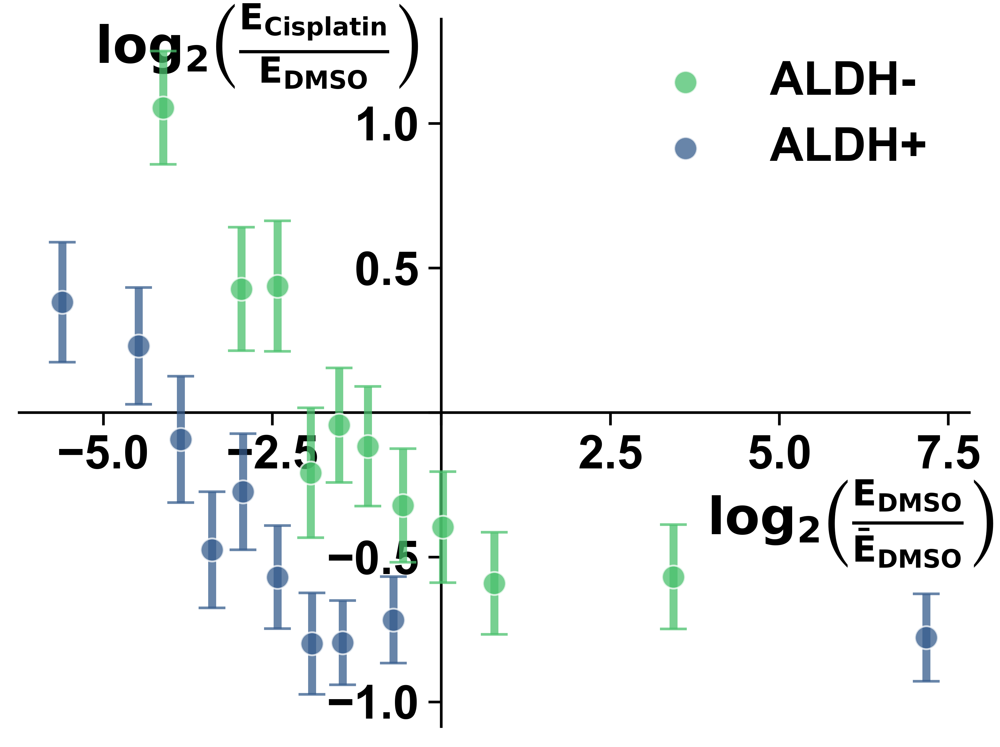

In [ ]:
# Initialize a DataFrame to store differential expression data
diff_plot = pd.DataFrame(index=range(0,9),columns=['CSC Expression','CSC Normalized Expression','CSC Chemo Fold Change',
                                  'CSC Chemo Error','CSC DOT1Li Fold Change','CSC DOT1Li Error','CSC Combo Fold Change',
                                  'CSC Combo Error','NonCSC Expression','NonCSC Normalized Expression',
                                  'NonCSC Chemo Fold Change','NonCSC Chemo Error','NonCSC DOT1Li Fold Change',
                                  'NonCSC DOT1Li Error','NonCSC Combo Fold Change','NonCSC Combo Error'])

# Loop through each cell type (CSC and NonCSC)
for celltype in ['CSC','NonCSC']:
    if celltype == 'CSC':
        cellfilt = ~expr_mean.columns.str.contains('NonCSC')
    else:
        cellfilt = expr_mean.columns.str.contains('NonCSC')
    
    # Filter the expression data for the current cell type
    celldf = expr_mean.loc[:,cellfilt]
    
    # Normalize the expression data to DMSO control
    cellnorm = np.log2(celldf.div(celldf.loc[:,celldf.columns.str.contains('DMSO')].values, axis=0))
    
    # Identify differentially expressed genes
    celldiffgenes = np.abs(cellnorm.loc[:,cellnorm.columns.str.contains('Chemo')])>1
    celldiffexp = celldf.loc[celldiffgenes.values,:]
    celldiffnorm = cellnorm.loc[celldiffgenes.values,:]
    
    # Calculate quantiles for DMSO expression
    cell_dmso = celldiffexp.loc[:,celldiffexp.columns.str.contains('DMSO')].squeeze()
    quantiles = np.percentile(cell_dmso,np.linspace(0,100,11))
    
    # Loop through each quantile range
    for qind in range(0,np.size(quantiles)-1):
        diff_plot.loc[qind,(celltype+' Expression')] = (quantiles[qind]+quantiles[qind+1])/2
        diff_plot.loc[qind,(celltype+' Normalized Expression')] = np.log2(diff_plot.loc[qind,(celltype+' Expression')]/
                                                                          cell_dmso.mean().item())
        qvals = np.log2(celldiffexp[cell_dmso.between(quantiles[qind],quantiles[qind+1],inclusive='right')])
        q_dmso = qvals.loc[:,qvals.columns.str.contains('DMSO')].squeeze()
        
        # Loop through each treatment type and calculate fold change and error
        for treatment in ['Chemo','DOT1Li','Combo']:
            q_cond = qvals.loc[:,qvals.columns.str.contains(treatment)].squeeze()
            diff_plot.loc[qind,(celltype+' '+treatment+' Fold Change')] = (q_cond-q_dmso).mean()
            diff_plot.loc[qind,(celltype+' '+treatment+' Error')] = (q_cond-q_dmso).sem()

# Create the scatter plot
fig, ax = plt.subplots()
sns.scatterplot(data=diff_plot,x='NonCSC Normalized Expression',y='NonCSC Chemo Fold Change',label='ALDH-',
                color=stem_palette['ALDH-'],clip_on = False, zorder=10, s=75,alpha=0.75)
for pos,y,err in zip(diff_plot['NonCSC Normalized Expression'],diff_plot['NonCSC Chemo Fold Change'],
                     diff_plot['NonCSC Chemo Error']):
    ax.errorbar(pos, y, yerr=err, lw=3, capsize=5, ecolor=stem_palette['ALDH-'], zorder=8,alpha=0.75)
sns.scatterplot(data=diff_plot,x='CSC Normalized Expression',y='CSC Chemo Fold Change',label='ALDH+',
                color=stem_palette['ALDH+'],clip_on = False, zorder=10, s=75,alpha=0.75)
for pos,y,err in zip(diff_plot['CSC Normalized Expression'],diff_plot['CSC Chemo Fold Change'],
                     diff_plot['CSC Chemo Error']):
    ax.errorbar(pos, y, yerr=err, lw=3, capsize=5, ecolor=stem_palette['ALDH+'], zorder=8,alpha=0.75)
    
# Set axis labels
ax.set_xlabel(r"$\mathbf{log_2\left(\frac {E_{DMSO}}{\bar E_{DMSO}}\right)}$")
ax.xaxis.set_label_coords(0.875, 0.35)
ax.set_ylabel(r'$\mathbf{log_2\left(\frac{E_{Cisplatin}}{E_{DMSO}}\right)}$', rotation=0)
ax.yaxis.set_label_coords(0.25, 0.9)

# Customize plot spines and ticks
ax.spines['left'].set_position('zero')
ax.spines['right'].set_color('none')
ax.yaxis.tick_left()
ax.spines['bottom'].set_position('zero')
ax.spines['top'].set_color('none')
ax.xaxis.tick_bottom()

# Add legend
ax.legend(frameon=False, loc='upper right')

# Hide specific tick labels
plt.setp(ax.get_xticklabels()[3], visible=False)
plt.setp(ax.get_yticklabels()[3], visible=False)

# Show and save the plot
plt.show()
fig.savefig(save_dir+'\\OCSC vs non-OCSC Gene Upregulation After Chemo.tif',dpi=600,transparent=True,
            bbox_inches='tight')

Mean:
CSC       0.398060
NonCSC   -0.190024
dtype: float64
Standard Deviation
CSC       1.552456
NonCSC    1.035556
dtype: float64


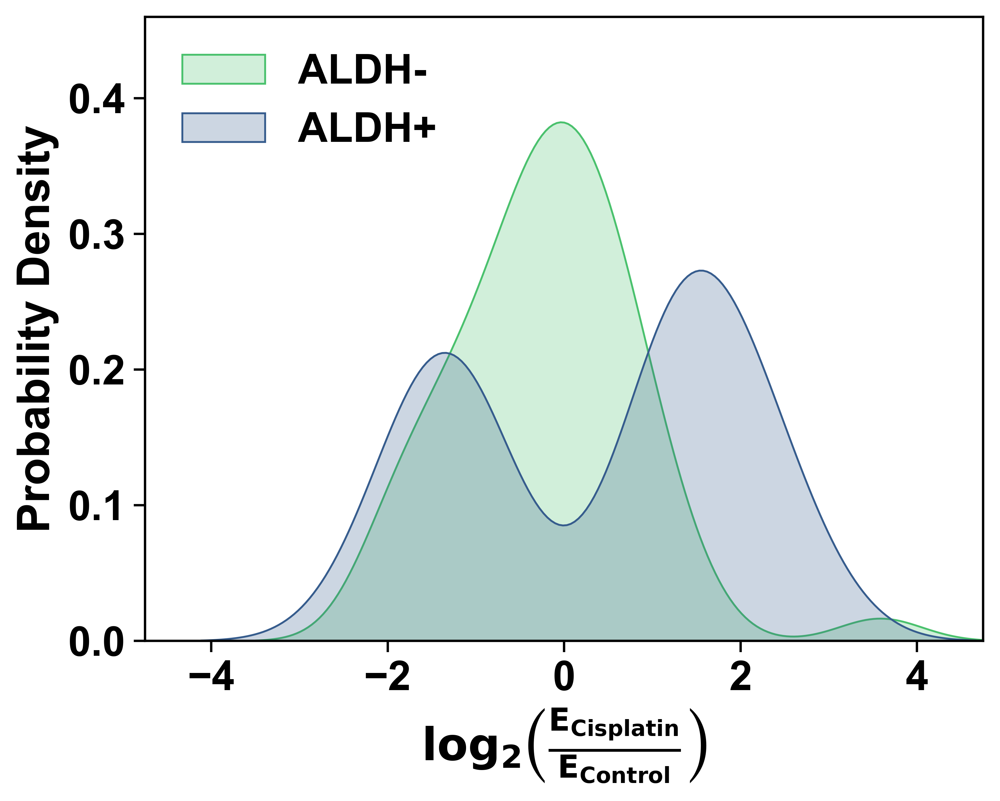

In [ ]:
# Select columns related to DMSO and Chemo treatments
chemo_pdf = expr_mean.iloc[:,expr_mean.columns.str.contains('DMSO')|expr_mean.columns.str.contains('Chemo')]

# Normalize the data by dividing by CSC_DMSO and filter out non-differentially expressed genes
hist_norm = np.log2(chemo_pdf.div(chemo_pdf['CSC_DMSO'], axis=0))
chemo_pdf = chemo_pdf[np.abs(hist_norm['CSC_Chemo'])>1]

# Calculate quantiles for CSC_DMSO
ctrl_quant = np.percentile(chemo_pdf['CSC_DMSO'],np.linspace(0,100,11))

# Filter the data based on the calculated quantiles
exp_hist_all = chemo_pdf[(chemo_pdf['CSC_DMSO']>ctrl_quant[0]) & (chemo_pdf['CSC_DMSO']<ctrl_quant[1])]

# Create a DataFrame to store the log2 fold changes for CSC and NonCSC
exp_hist = pd.DataFrame(columns = ['CSC','NonCSC'])
exp_hist['CSC'] = np.log2(exp_hist_all['CSC_Chemo'].div(exp_hist_all['CSC_DMSO'], axis=0))
exp_hist['NonCSC'] = np.log2(exp_hist_all['NonCSC_Chemo'].div(exp_hist_all['NonCSC_DMSO'], axis=0))

# Melt the DataFrame for plotting
plotdata = exp_hist.melt(ignore_index=False).reset_index()

# Print the mean and standard deviation of the log2 fold changes
print('Mean:')
print(exp_hist.mean())
print('Standard Deviation')
print(exp_hist.std())

# Define labels for the plot legend
labels = ["ALDH-", "ALDH+"]

# Create the KDE plot
fig, ax = plt.subplots()
sns.kdeplot(data=plotdata, x='value', hue='variable', fill=True, common_norm=False, palette=stem_palette)
ax.set_xlabel(r'$\mathbf{log_2\left(\frac{E_{Cisplatin}}{E_{Control}}\right)}$')
ax.set_ylabel('Probability Density')
ax.set_xlim([-4.75,4.75])
ax.set_ylim([0,0.46])
ax.legend(labels=labels, frameon=False, facecolor=None, loc='upper left')

# Show and save the plot
plt.show()
fig.savefig(save_dir+'\\Chemo Upregulation PDFs for ALDH+ Genes.tif', dpi=600, transparent=True, bbox_inches='tight')

Mean:
CSC      -0.264895
NonCSC    1.054642
dtype: float64
Standard Deviation
CSC       0.954493
NonCSC    1.326614
dtype: float64


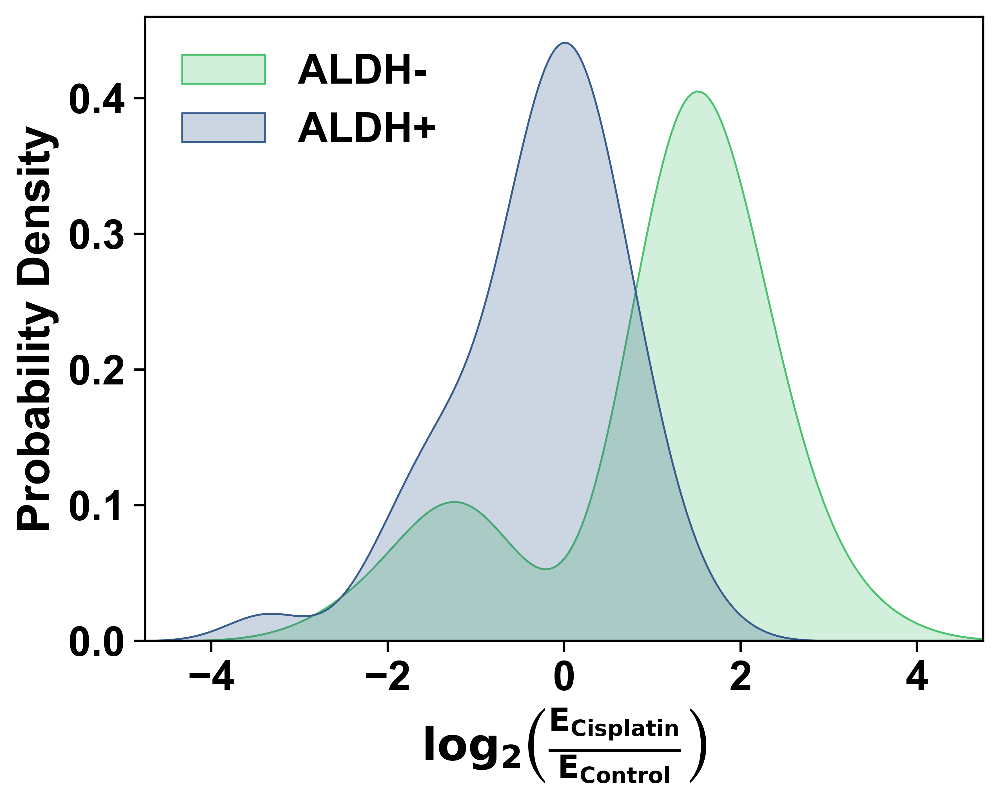

In [ ]:
# Select columns related to DMSO and Chemo treatments
chemo_pdf = expr_mean.iloc[:,expr_mean.columns.str.contains('DMSO')|expr_mean.columns.str.contains('Chemo')]

# Normalize the data by dividing by NonCSC_DMSO and filter out non-differentially expressed genes
hist_norm = np.log2(chemo_pdf.div(chemo_pdf['NonCSC_DMSO'], axis=0))
chemo_pdf = chemo_pdf[np.abs(hist_norm['NonCSC_Chemo'])>1]

# Calculate quantiles for NonCSC_DMSO
ctrl_quant = np.percentile(chemo_pdf['NonCSC_DMSO'],np.linspace(0,100,11))

# Filter the data based on the calculated quantiles
exp_hist_all = chemo_pdf[(chemo_pdf['NonCSC_DMSO']>ctrl_quant[0]) & (chemo_pdf['NonCSC_DMSO']<ctrl_quant[1])]

# Create a DataFrame to store the log2 fold changes for CSC and NonCSC
exp_hist = pd.DataFrame(columns = ['CSC','NonCSC'])
exp_hist['CSC'] = np.log2(exp_hist_all['CSC_Chemo'].div(exp_hist_all['CSC_DMSO'], axis=0))
exp_hist['NonCSC'] = np.log2(exp_hist_all['NonCSC_Chemo'].div(exp_hist_all['NonCSC_DMSO'], axis=0))

# Melt the DataFrame for plotting
plotdata = exp_hist.melt(ignore_index=False).reset_index()

# Print the mean and standard deviation of the log2 fold changes
print('Mean:')
print(exp_hist.mean())
print('Standard Deviation')
print(exp_hist.std())

# Define labels for the plot legend
labels = ["ALDH-", "ALDH+"]

# Create the KDE plot
fig, ax = plt.subplots()
sns.kdeplot(data=plotdata, x='value', hue='variable', fill=True, common_norm=False, palette=stem_palette)
ax.set_xlabel(r'$\mathbf{log_2\left(\frac{E_{Cisplatin}}{E_{Control}}\right)}$')
ax.set_ylabel('Probability Density')
ax.set_xlim([-4.75,4.75])
ax.set_ylim([0,0.46])
ax.legend(labels=labels, frameon=False, facecolor=None, loc='upper left')

# Show and save the plot
plt.show()
fig.savefig(save_dir+'\\Chemo Upregulation PDFs for ALDH- Genes.tif', dpi=600, transparent=True, bbox_inches='tight')

Mean:
ALDH+           0.398060
DOT1Li ALDH+    0.029616
dtype: float64
Standard Deviation
ALDH+           1.552456
DOT1Li ALDH+    1.628837
dtype: float64


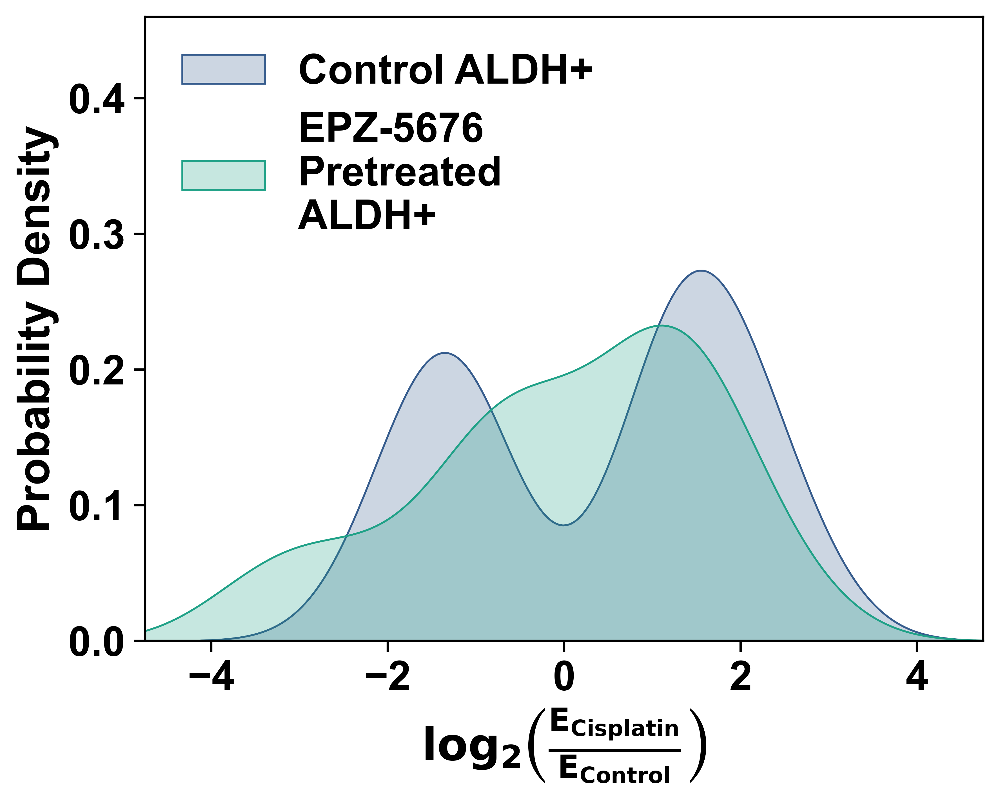

In [ ]:
# Select columns related to CSC
dot1li_pdf = expr_mean.iloc[:,expr_mean.columns.str.contains('CSC')]

# Filter out non-differentially expressed genes
hist_norm = np.log2(dot1li_pdf.div(dot1li_pdf['CSC_DMSO'], axis=0))
dot1li_pdf = dot1li_pdf[np.abs(hist_norm['CSC_Chemo']) > 1]

# Calculate quantiles for CSC_DMSO
ctrl_quant = np.percentile(dot1li_pdf['CSC_DMSO'], np.linspace(0, 100, 11))

# Filter the data based on the calculated quantiles
exp_hist_all = dot1li_pdf[(dot1li_pdf['CSC_DMSO'] > ctrl_quant[0]) & (dot1li_pdf['CSC_DMSO'] < ctrl_quant[1])]

# Create a DataFrame to store the log2 fold changes for ALDH+ and DOT1Li ALDH+
exp_hist = pd.DataFrame(columns=['ALDH+', 'DOT1Li ALDH+'])
exp_hist['ALDH+'] = np.log2(exp_hist_all['CSC_Chemo'].div(exp_hist_all['CSC_DMSO'], axis=0))
exp_hist['DOT1Li ALDH+'] = np.log2(exp_hist_all['CSC_Combo'].div(exp_hist_all['CSC_DOT1Li'], axis=0))

# Melt the DataFrame for plotting
plotdata = exp_hist.melt(ignore_index=False).reset_index()

# Print the mean and standard deviation of the log2 fold changes
print('Mean:')
print(exp_hist.mean())
print('Standard Deviation')
print(exp_hist.std())

# Define labels for the plot legend
labels = ["Control ALDH+", "EPZ-5676\nPretreated\nALDH+"]

# Create the KDE plot
fig, ax = plt.subplots()
sns.kdeplot(data=plotdata, x='value', hue='variable', hue_order=['DOT1Li ALDH+', 'ALDH+'], fill=True, common_norm=False,
            palette=stem_palette)
ax.set_xlabel(r'$\mathbf{log_2\left(\frac{E_{Cisplatin}}{E_{Control}}\right)}$')
ax.set_ylabel('Probability Density')
ax.set_xlim([-4.75, 4.75])
ax.set_ylim([0, 0.46])
ax.legend(labels=labels, frameon=False, facecolor=None, loc='upper left')

# Show and save the plot
plt.show()
fig.savefig(save_dir + '\\EPZ-5676 Upregulation PDFs for ALDH+.tif', dpi=600, transparent=True, bbox_inches='tight')

Mean:
ALDH-           1.054642
DOT1Li ALDH-    0.746481
dtype: float64
Standard Deviation
ALDH-           1.326614
DOT1Li ALDH-    1.903287
dtype: float64


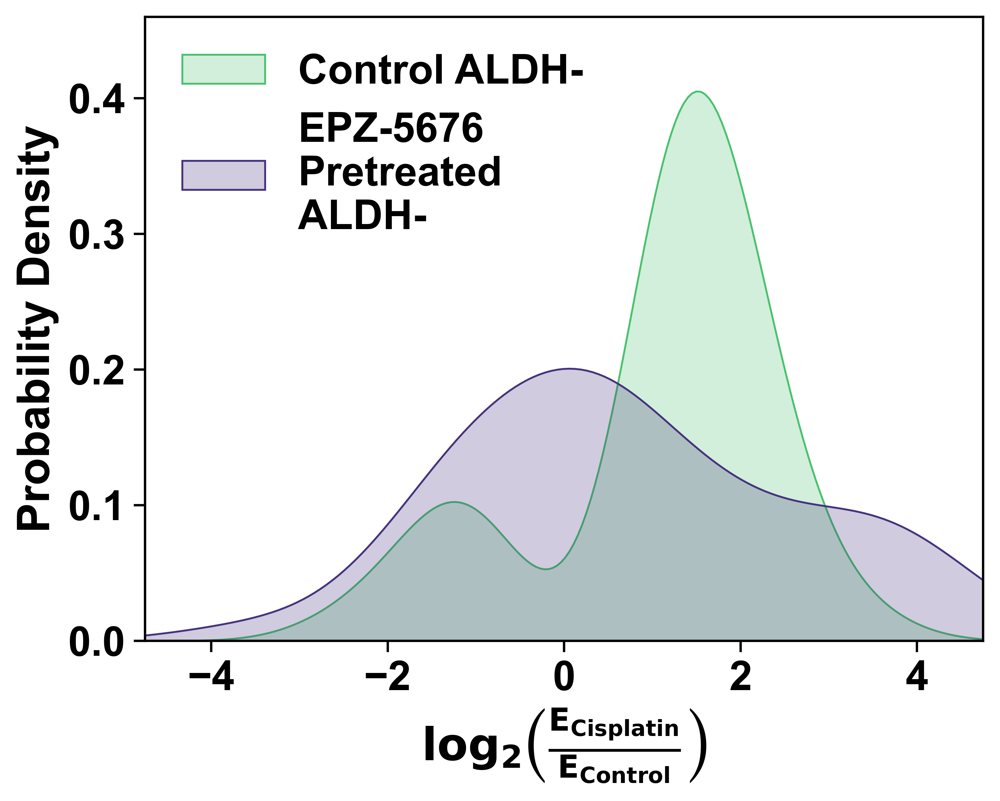

In [ ]:
# Select columns related to NonCSC
dot1li_pdf = expr_mean.iloc[:,expr_mean.columns.str.contains('NonCSC')]

# Filter out non-differentially expressed genes
hist_norm = np.log2(dot1li_pdf.div(dot1li_pdf['NonCSC_DMSO'], axis=0))
dot1li_pdf = dot1li_pdf[np.abs(hist_norm['NonCSC_Chemo']) > 1]

# Calculate quantiles for NonCSC_DMSO
ctrl_quant = np.percentile(dot1li_pdf['NonCSC_DMSO'], np.linspace(0, 100, 11))

# Filter the data based on the calculated quantiles
exp_hist_all = dot1li_pdf[(dot1li_pdf['NonCSC_DMSO'] > ctrl_quant[0]) & (dot1li_pdf['NonCSC_DMSO'] < ctrl_quant[1])]

# Create a DataFrame to store the log2 fold changes for ALDH- and DOT1Li ALDH-
exp_hist = pd.DataFrame(columns=['ALDH-', 'DOT1Li ALDH-'])
exp_hist['ALDH-'] = np.log2(exp_hist_all['NonCSC_Chemo'].div(exp_hist_all['NonCSC_DMSO'], axis=0))
exp_hist['DOT1Li ALDH-'] = np.log2(exp_hist_all['NonCSC_Combo'].div(exp_hist_all['NonCSC_DOT1Li'], axis=0))

# Melt the DataFrame for plotting
plotdata = exp_hist.melt(ignore_index=False).reset_index()

# Print the mean and standard deviation of the log2 fold changes
print('Mean:')
print(exp_hist.mean())
print('Standard Deviation')
print(exp_hist.std())

# Define labels for the plot legend
labels = ["Control ALDH-", "EPZ-5676\nPretreated\nALDH-"]

# Create the KDE plot
fig, ax = plt.subplots()
sns.kdeplot(data=plotdata, x='value', hue='variable', hue_order=['DOT1Li ALDH-', 'ALDH-'], fill=True, common_norm=False,
            palette=stem_palette)
ax.set_xlabel(r'$\mathbf{log_2\left(\frac{E_{Cisplatin}}{E_{Control}}\right)}$')
ax.set_ylabel('Probability Density')
ax.set_xlim([-4.75, 4.75])
ax.set_ylim([0, 0.46])
ax.legend(labels=labels, frameon=False, facecolor=None, loc='upper left')

# Show and save the plot
plt.show()
fig.savefig(save_dir + '\\EPZ-5676 Upregulation PDFs for ALDH-.tif', dpi=600, transparent=True, bbox_inches='tight')

Mean:
CSC       1.52791
NonCSC    0.78659
dtype: float64
Standard Deviation
CSC       0.436510
NonCSC    0.691454
dtype: float64


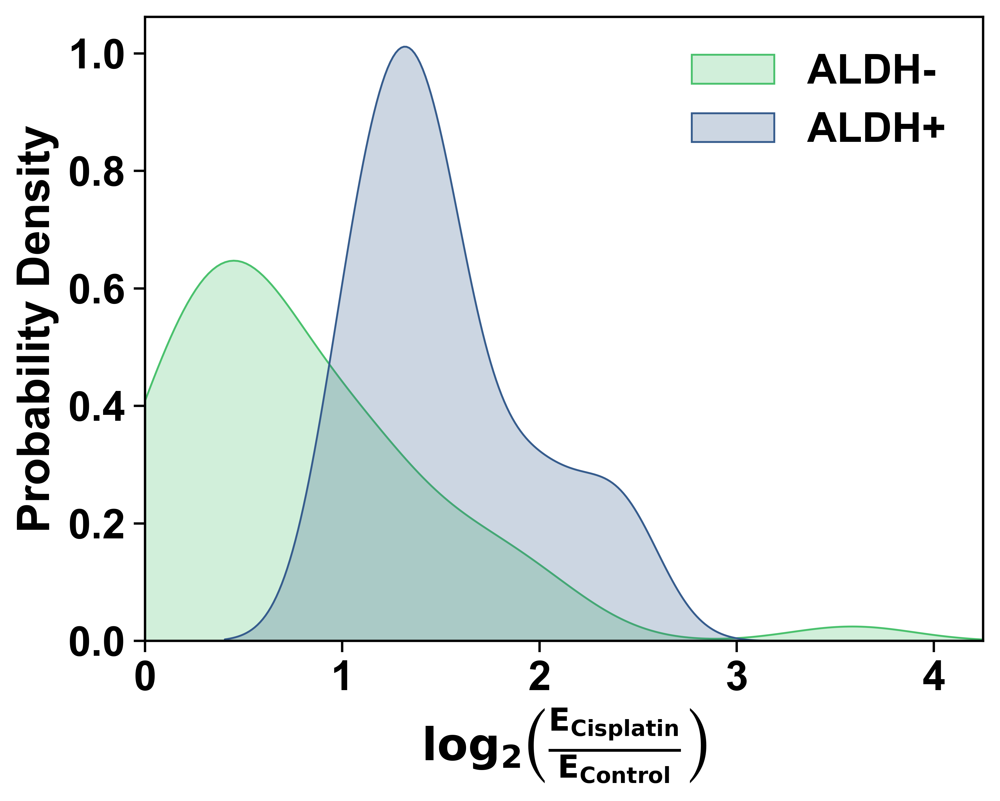

In [ ]:
# Select columns related to DMSO and Chemo treatments
chemo_pdf = expr_mean.iloc[:,expr_mean.columns.str.contains('DMSO')|expr_mean.columns.str.contains('Chemo')]

# Normalize the data by dividing by CSC_DMSO and filter out non-differentially expressed genes
hist_norm = np.log2(chemo_pdf.div(chemo_pdf['CSC_DMSO'], axis=0))
chemo_pdf = chemo_pdf[np.abs(hist_norm['CSC_Chemo'])>1]

# Calculate quantiles for CSC_DMSO
ctrl_quant = np.percentile(chemo_pdf['CSC_DMSO'],np.linspace(0,100,11))

# Filter the data based on the calculated quantiles
exp_hist_all = chemo_pdf[(chemo_pdf['CSC_DMSO']>ctrl_quant[0]) & (chemo_pdf['CSC_DMSO']<ctrl_quant[1])]

# Create a DataFrame to store the log2 fold changes for CSC and NonCSC
exp_hist = pd.DataFrame(columns = ['CSC','NonCSC'])
exp_hist['CSC'] = np.abs(np.log2(exp_hist_all['CSC_Chemo'].div(exp_hist_all['CSC_DMSO'], axis=0)))
exp_hist['NonCSC'] = np.abs(np.log2(exp_hist_all['NonCSC_Chemo'].div(exp_hist_all['NonCSC_DMSO'], axis=0)))

# Melt the DataFrame for plotting
plotdata = exp_hist.melt(ignore_index=False).reset_index()

# Print the mean and standard deviation of the log2 fold changes
print('Mean:')
print(exp_hist.mean())
print('Standard Deviation')
print(exp_hist.std())

# Define labels for the plot legend
labels = ["ALDH-", "ALDH+"]

# Create the KDE plot
fig, ax = plt.subplots()
sns.kdeplot(data=plotdata, x='value', hue='variable', fill=True, common_norm=False, palette=stem_palette, clip=[0,4.25])
ax.set_xlabel(r'$\mathbf{log_2\left(\frac{E_{Cisplatin}}{E_{Control}}\right)}$')
ax.set_ylabel('Probability Density')
ax.set_xlim([0,4.25])
# ax.set_ylim([0,0.46])
ax.legend(labels=labels, frameon=False, facecolor=None, loc='upper right')

# Show and save the plot
plt.show()
fig.savefig(save_dir+'\\Chemo Diff Exp PDFs for ALDH+ Genes.tif',dpi=600,transparent=True, bbox_inches='tight')

Mean:
CSC       0.716845
NonCSC    1.595932
dtype: float64
Standard Deviation
CSC       0.676387
NonCSC    0.541567
dtype: float64


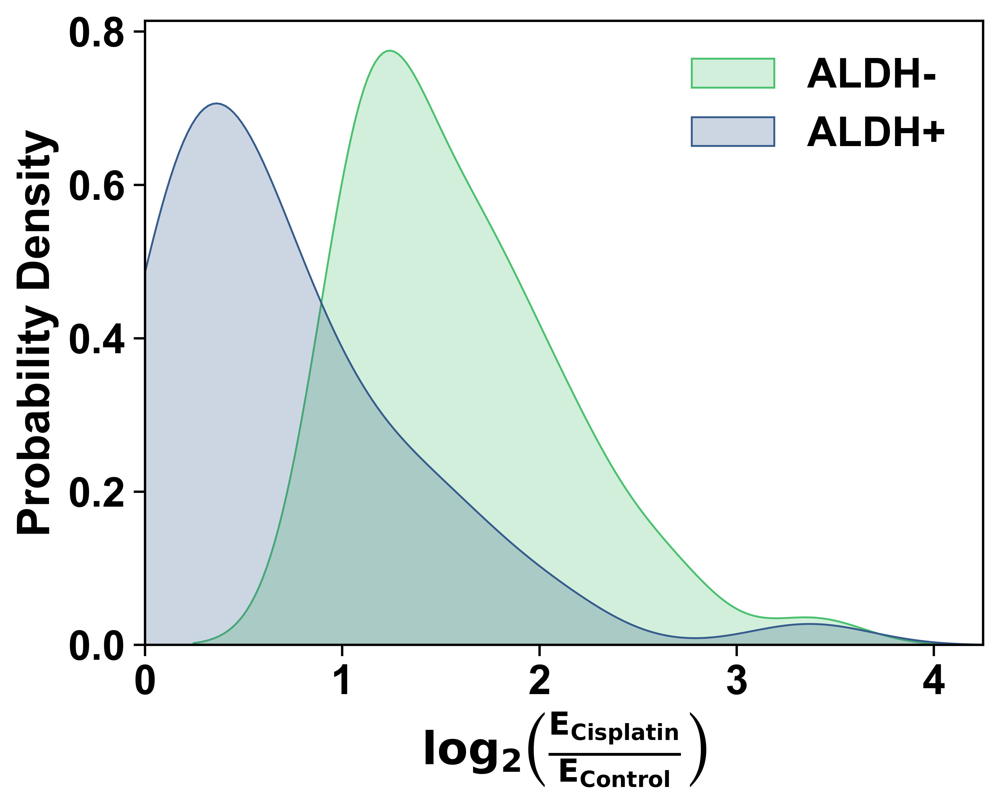

In [ ]:
# Select columns related to DMSO and Chemo treatments
chemo_pdf = expr_mean.iloc[:,expr_mean.columns.str.contains('DMSO')|expr_mean.columns.str.contains('Chemo')]

# Normalize the data by dividing by NonCSC_DMSO and filter out non-differentially expressed genes
hist_norm = np.log2(chemo_pdf.div(chemo_pdf['NonCSC_DMSO'], axis=0))
chemo_pdf = chemo_pdf[np.abs(hist_norm['NonCSC_Chemo'])>1]

# Calculate quantiles for NonCSC_DMSO
ctrl_quant = np.percentile(chemo_pdf['NonCSC_DMSO'],np.linspace(0,100,11))

# Filter the data based on the calculated quantiles
exp_hist_all = chemo_pdf[(chemo_pdf['NonCSC_DMSO']>ctrl_quant[0]) & (chemo_pdf['NonCSC_DMSO']<ctrl_quant[1])]

# Create a DataFrame to store the log2 fold changes for CSC and NonCSC
exp_hist = pd.DataFrame(columns = ['CSC','NonCSC'])
exp_hist['CSC'] = np.abs(np.log2(exp_hist_all['CSC_Chemo'].div(exp_hist_all['CSC_DMSO'], axis=0)))
exp_hist['NonCSC'] = np.abs(np.log2(exp_hist_all['NonCSC_Chemo'].div(exp_hist_all['NonCSC_DMSO'], axis=0)))

# Melt the DataFrame for plotting
plotdata = exp_hist.melt(ignore_index=False).reset_index()

# Print the mean and standard deviation of the log2 fold changes
print('Mean:')
print(exp_hist.mean())
print('Standard Deviation')
print(exp_hist.std())

# Define labels for the plot legend
labels = ["ALDH-", "ALDH+"]

# Create the KDE plot
fig, ax = plt.subplots()
sns.kdeplot(data=plotdata, x='value', hue='variable', fill=True, common_norm=False, palette=stem_palette, clip=[0,4.25])
ax.set_xlabel(r'$\mathbf{log_2\left(\frac{E_{Cisplatin}}{E_{Control}}\right)}$')
ax.set_ylabel('Probability Density')
ax.set_xlim([0,4.25])
# ax.set_ylim([0,0.46])
ax.legend(labels=labels, frameon=False, facecolor=None, loc='upper right')

# Show and save the plot
plt.show()
fig.savefig(save_dir+'\\Chemo Diff Exp PDFs for ALDH- Genes.tif', dpi=600, transparent=True, bbox_inches='tight')

Mean:
ALDH+           1.527910
DOT1Li ALDH+    1.354004
dtype: float64
Standard Deviation
ALDH+           0.436510
DOT1Li ALDH+    0.885445
dtype: float64


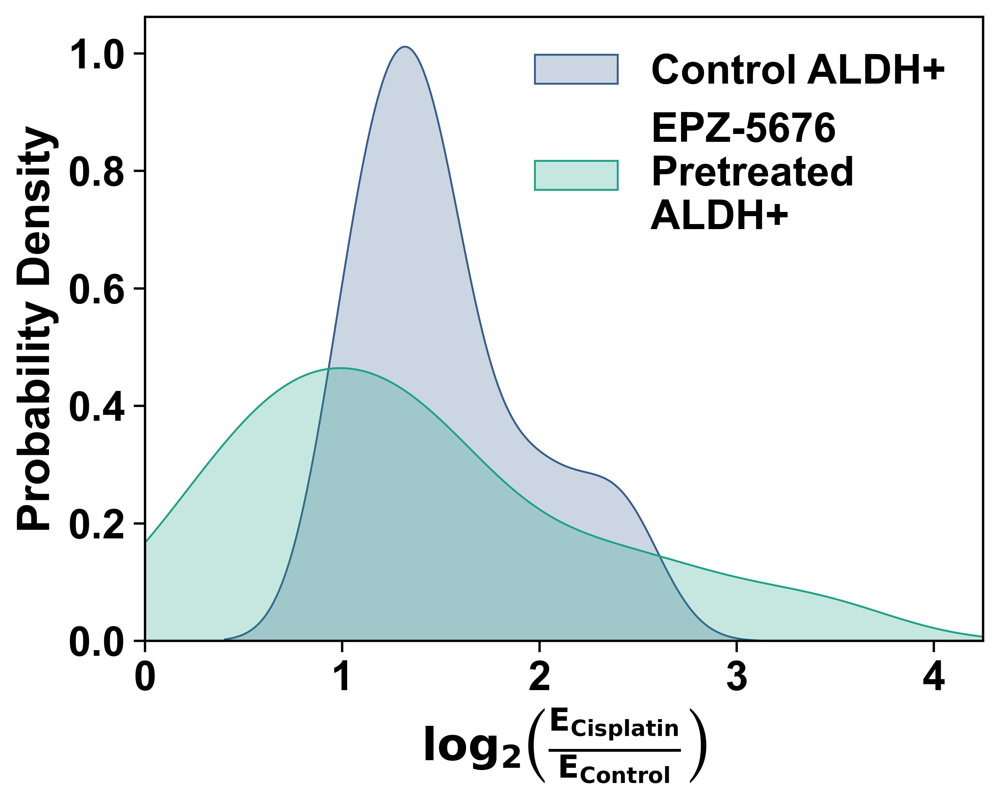

In [ ]:
# Select columns related to CSC
dot1li_pdf = expr_mean.iloc[:,expr_mean.columns.str.contains('CSC')]

# Filter out non-differentially expressed genes
hist_norm = np.log2(dot1li_pdf.div(dot1li_pdf['CSC_DMSO'], axis=0))
dot1li_pdf = dot1li_pdf[np.abs(hist_norm['CSC_Chemo']) > 1]

# Calculate quantiles for CSC_DMSO
ctrl_quant = np.percentile(dot1li_pdf['CSC_DMSO'], np.linspace(0, 100, 11))

# Filter the data based on the calculated quantiles
exp_hist_all = dot1li_pdf[(dot1li_pdf['CSC_DMSO'] > ctrl_quant[0]) & (dot1li_pdf['CSC_DMSO'] < ctrl_quant[1])]

# Create a DataFrame to store the log2 fold changes for ALDH+ and DOT1Li ALDH+
exp_hist = pd.DataFrame(columns=['ALDH+', 'DOT1Li ALDH+'])
exp_hist['ALDH+'] = np.abs(np.log2(exp_hist_all['CSC_Chemo'].div(exp_hist_all['CSC_DMSO'], axis=0)))
exp_hist['DOT1Li ALDH+'] = np.abs(np.log2(exp_hist_all['CSC_Combo'].div(exp_hist_all['CSC_DOT1Li'], axis=0)))

# Melt the DataFrame for plotting
plotdata = exp_hist.melt(ignore_index=False).reset_index()

# Print the mean and standard deviation of the log2 fold changes
print('Mean:')
print(exp_hist.mean())
print('Standard Deviation')
print(exp_hist.std())

# Define labels for the plot legend
labels = ["Control ALDH+", "EPZ-5676\nPretreated\nALDH+"]

# Create the KDE plot
fig, ax = plt.subplots()
sns.kdeplot(data=plotdata, x='value', hue='variable', hue_order=['DOT1Li ALDH+', 'ALDH+'], fill=True, common_norm=False,
            palette=stem_palette, clip=[0, 4.25])
ax.set_xlabel(r'$\mathbf{log_2\left(\frac{E_{Cisplatin}}{E_{Control}}\right)}$')
ax.set_ylabel('Probability Density')
ax.set_xlim([0, 4.25])
# ax.set_ylim([0,0.46])
ax.legend(labels=labels, frameon=False, facecolor=None, loc='upper right')

# Show and save the plot
plt.show()
fig.savefig(save_dir + '\\EPZ-5676 Diff Exp PDFs for ALDH+.tif', dpi=600, transparent=True, bbox_inches='tight')

Mean:
ALDH-           1.595932
DOT1Li ALDH-    1.573900
dtype: float64
Standard Deviation
ALDH-           0.541567
DOT1Li ALDH-    1.288374
dtype: float64


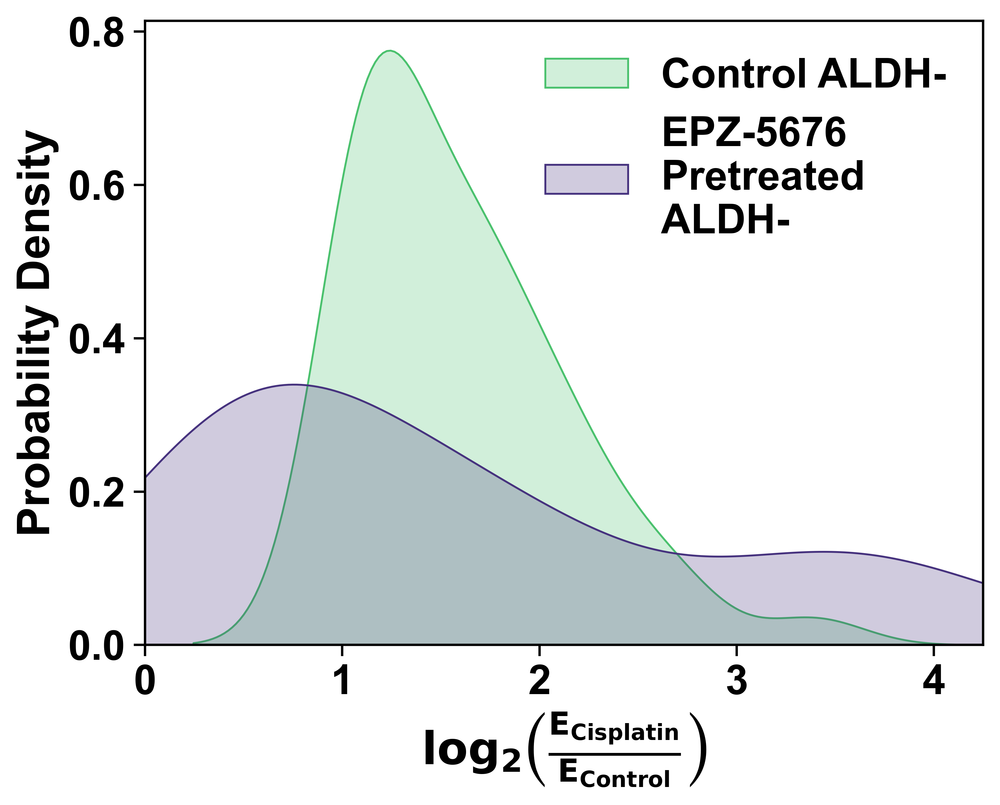

In [ ]:
# Select columns related to NonCSC
dot1li_pdf = expr_mean.iloc[:,expr_mean.columns.str.contains('NonCSC')]

# Filter out non-differentially expressed genes
hist_norm = np.log2(dot1li_pdf.div(dot1li_pdf['NonCSC_DMSO'], axis=0))
dot1li_pdf = dot1li_pdf[np.abs(hist_norm['NonCSC_Chemo']) > 1]

# Calculate quantiles for NonCSC_DMSO
ctrl_quant = np.percentile(dot1li_pdf['NonCSC_DMSO'], np.linspace(0, 100, 11))

# Filter the data based on the calculated quantiles
exp_hist_all = dot1li_pdf[(dot1li_pdf['NonCSC_DMSO'] > ctrl_quant[0]) & (dot1li_pdf['NonCSC_DMSO'] < ctrl_quant[1])]

# Create a DataFrame to store the log2 fold changes for ALDH- and DOT1Li ALDH-
exp_hist = pd.DataFrame(columns=['ALDH-', 'DOT1Li ALDH-'])
exp_hist['ALDH-'] = np.abs(np.log2(exp_hist_all['NonCSC_Chemo'].div(exp_hist_all['NonCSC_DMSO'], axis=0)))
exp_hist['DOT1Li ALDH-'] = np.abs(np.log2(exp_hist_all['NonCSC_Combo'].div(exp_hist_all['NonCSC_DOT1Li'], axis=0)))

# Melt the DataFrame for plotting
plotdata = exp_hist.melt(ignore_index=False).reset_index()

# Print the mean and standard deviation of the log2 fold changes
print('Mean:')
print(exp_hist.mean())
print('Standard Deviation')
print(exp_hist.std())

# Define labels for the plot legend
labels = ["Control ALDH-", "EPZ-5676\nPretreated\nALDH-"]

# Create the KDE plot
fig, ax = plt.subplots()
sns.kdeplot(data=plotdata, x='value', hue='variable', hue_order=['DOT1Li ALDH-', 'ALDH-'], fill=True, common_norm=False,
            palette=stem_palette, clip=[0, 4.25])
ax.set_xlabel(r'$\mathbf{log_2\left(\frac{E_{Cisplatin}}{E_{Control}}\right)}$')
ax.set_ylabel('Probability Density')
ax.set_xlim([0, 4.25])
# ax.set_ylim([0,0.46])
ax.legend(labels=labels, frameon=False, facecolor=None, loc='upper right')

# Show and save the plot
plt.show()
fig.savefig(save_dir + '\\EPZ-5676 Diff Exp PDFs for ALDH-.tif', dpi=600, transparent=True, bbox_inches='tight')

# Create scRNA-seq Plots

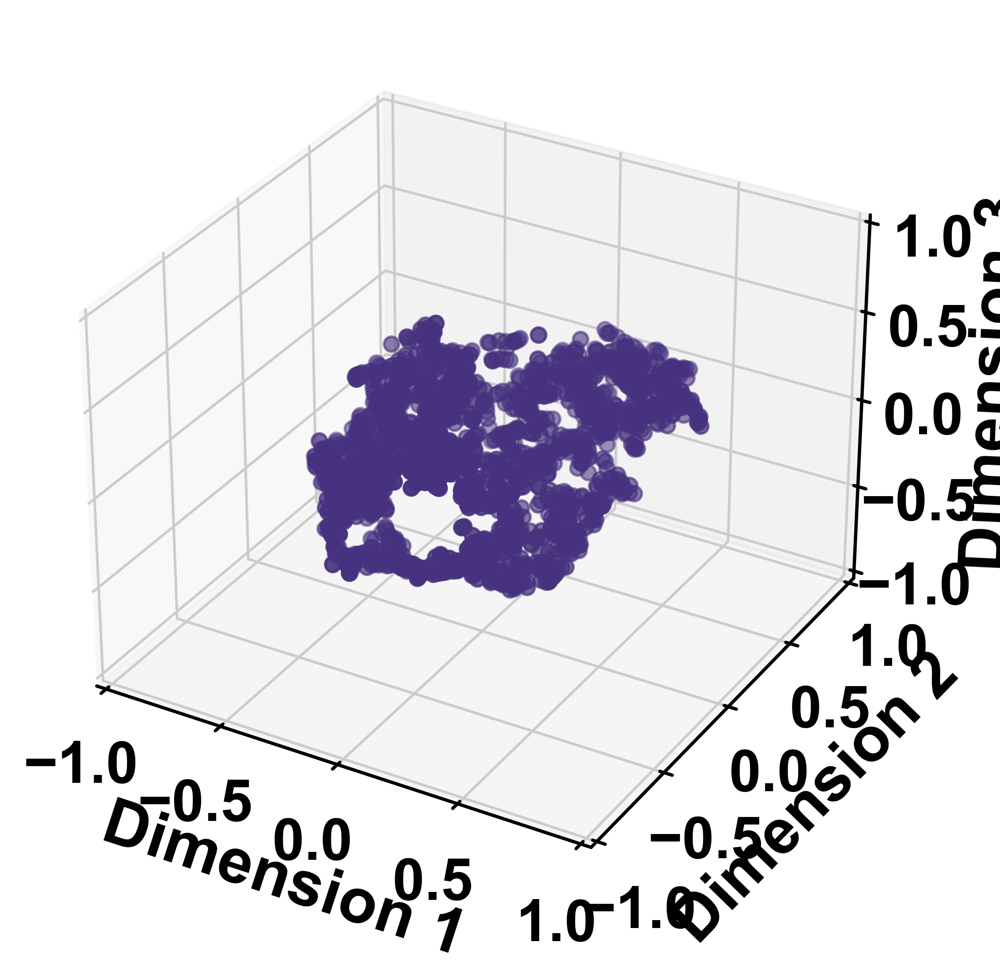

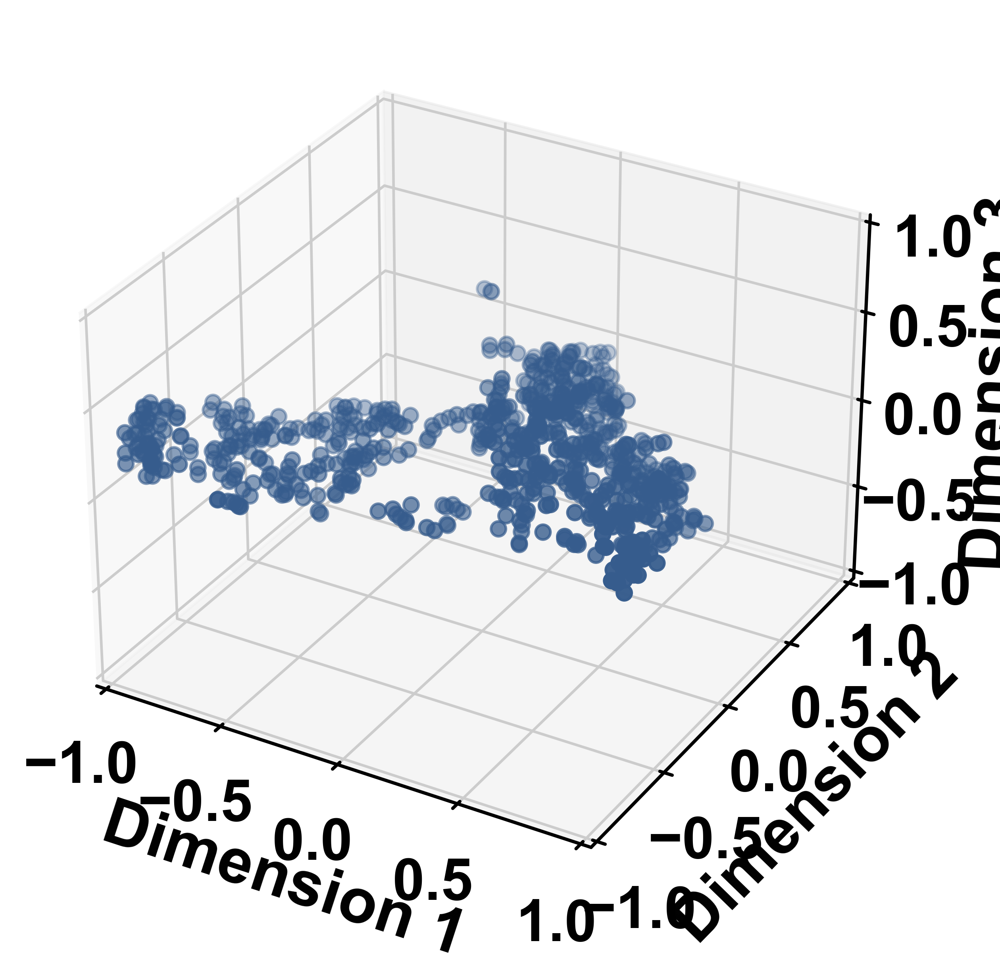

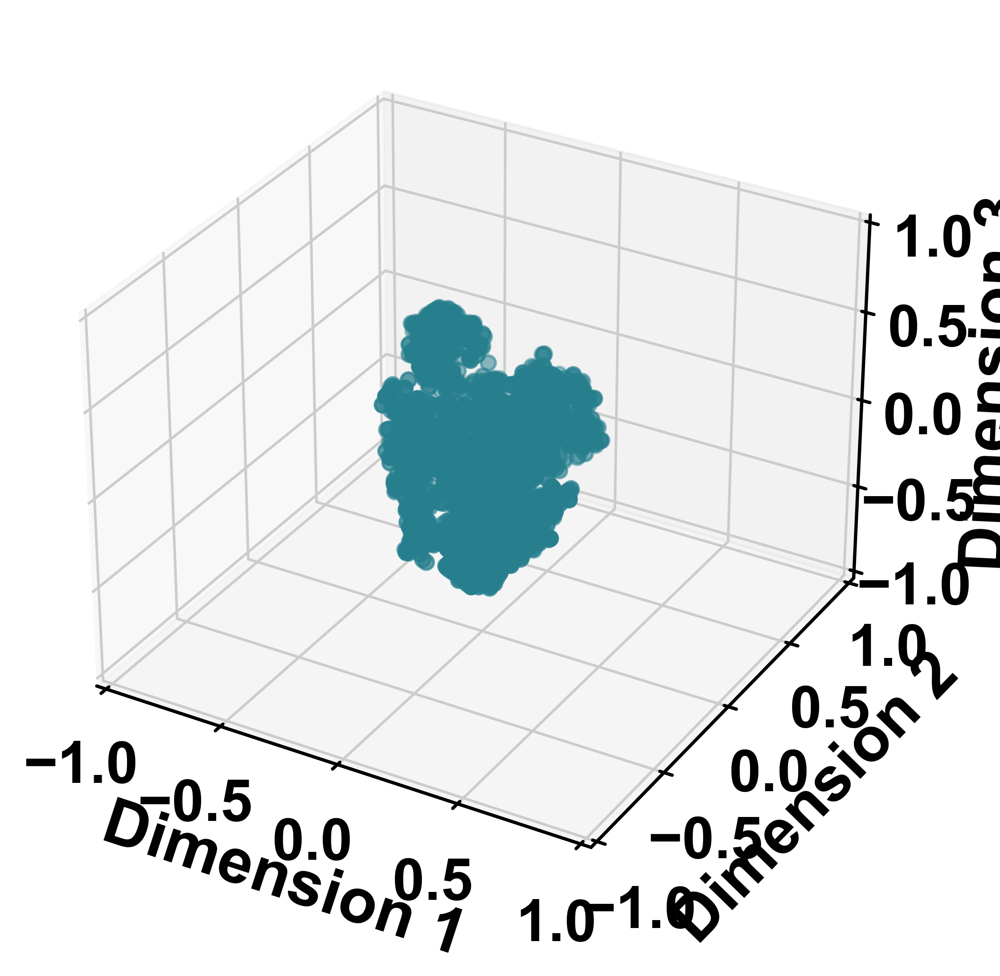

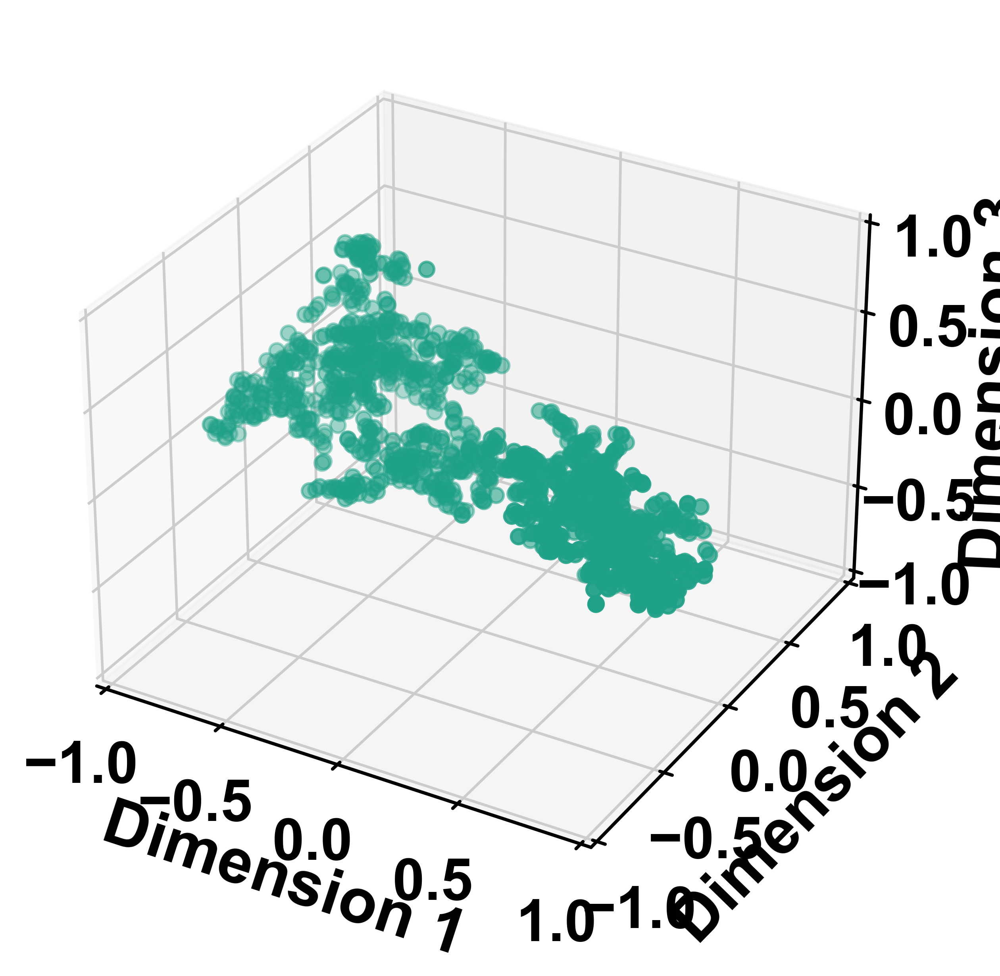

In [ ]:
# Initialize DataFrames to store mean TSNE values and radius of gyration
tsne_mean = pd.DataFrame(index=tsne_conds, columns=[0, 1, 2])
radius_gyration = pd.DataFrame(index=tsne_conds, columns=['Radius', 'SE'])

# Loop through each condition
for num, cond in enumerate(tsne_conds):
    # Filter TSNE data for the current condition
    tsne_current = tsne_all[tsne_all.index == cond]
    
    # Calculate the mean TSNE values for the current condition
    tsne_mean.loc[cond] = tsne_current.mean()
    
    # Calculate the squared differences from the mean
    tsne_diff = ((tsne_all[tsne_all.index == cond] - tsne_mean.loc[cond]) ** 2).sum(axis=1)
    
    # Calculate the radius of gyration
    tsne_radius = (tsne_diff.mean()) ** (1 / 2)
    radius_gyration.loc[cond, 'Radius'] = tsne_radius
    
    # Calculate the standard error of the radius of gyration
    # Reference: https://stats.stackexchange.com/questions/156518/what-is-the-standard-error-of-the-sample-standard-deviation
    mu4 = (tsne_diff ** 2).mean()
    se_square = (1 / len(tsne_diff) * (mu4 - (len(tsne_diff) - 3) / (len(tsne_diff) - 1) * tsne_radius ** 4)) ** (1 / 2)
    radius_gyration.loc[cond, 'SE'] = 1 / (2 * tsne_radius) * se_square
    
    # Create a 3D scatter plot for the current condition
    fig = plt.figure()
    ax = plt.axes(projection='3d')
    ax.scatter(tsne_current[0], tsne_current[1], tsne_current[2], color=sns.color_palette()[num])
    ax.set_zlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.set_xlim(-1, 1)
    ax.set_xlabel('Dimension 1')
    ax.set_ylabel('Dimension 2')
    ax.set_zlabel('Dimension 3')
    
    # Show and save the plot
    plt.show()
    fig.savefig(save_dir + '\\' + cond + ' TSNE.tif', dpi=600, transparent=True, bbox_inches='tight')

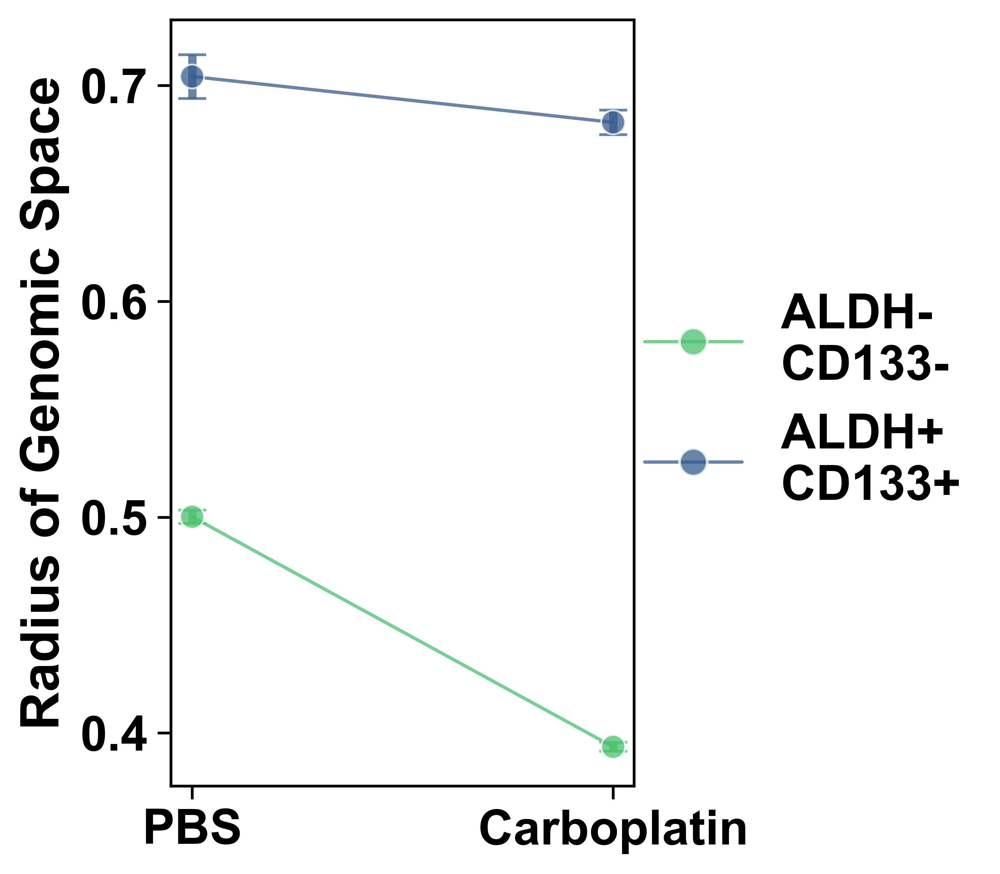

In [ ]:
# Reset the index of the radius_gyration DataFrame and rename the index column to 'Sample'
plotradius = radius_gyration.reset_index(names=['Sample']).copy()

# Initialize the 'Treatment' column with 'PBS'
plotradius['Treatment'] = 'PBS'

# Update the 'Treatment' column to 'Carboplatin' for samples containing 'carb' in their name
plotradius.loc[plotradius.Sample.str.contains('carb'), 'Treatment'] = 'Carboplatin'

# Initialize the 'Stem' column with 'ALDH+/CD133+'
plotradius['Stem'] = 'ALDH+/CD133+'

# Update the 'Stem' column to 'ALDH-/CD133-' for samples containing 'dn' in their name
plotradius.loc[plotradius.Sample.str.contains('dn'), 'Stem'] = 'ALDH-/CD133-'

# Define labels for the legend
lab = ['ALDH-\nCD133-', 'ALDH+\nCD133+']

# Define handles for the legend
han = [mpl.lines.Line2D([], [], marker='.', color=stem_palette['ALDH-/CD133-'], label='ALDH-\nCD133-',
                        markeredgecolor='w', markersize=20, alpha=0.75),
       mpl.lines.Line2D([], [], marker='.', color=stem_palette['ALDH+/CD133+'], label='ALDH+\nCD133+',
                        markeredgecolor='w', markersize=20, alpha=0.75)]

# Create a figure and axis for the plot
fig, ax = plt.subplots(figsize=[3, 5])

# Plot the line plot for the radius of gyration
sns.lineplot(data=plotradius, x='Treatment', y='Radius', hue='Stem', palette=stem_palette, clip_on=False, zorder=10, alpha=0.75)

# Plot the scatter plot for the radius of gyration
sns.scatterplot(data=plotradius, x='Treatment', y='Radius', hue='Stem', palette=stem_palette, clip_on=False, zorder=10, s=75, alpha=0.75)

# Add error bars to the plot
for pos, y, err, col in zip(plotradius['Treatment'], plotradius['Radius'], plotradius['SE'], plotradius['Stem']):
    ax.errorbar(pos, y, yerr=err, lw=3, capsize=5, ecolor=stem_palette[col], zorder=8, alpha=0.75)

# Set the x-axis label
ax.set_xlabel('')

# Set the y-axis label
ax.set_ylabel('Radius of Genomic Space')

# Add the legend to the plot
ax.legend(title='', labels=lab, handles=han, frameon=False, facecolor=None, bbox_to_anchor=(1.8, 0.7))

# Show the plot
plt.show()

# Save the plot as a TIFF file
fig.savefig(save_dir + '\\Radius of Genomic Space.tif', dpi=600, transparent=True, bbox_inches='tight')